In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
! git clone 'https://github.com/ultralytics/yolov5' '/content/gdrive/MyDrive/object_detection/yolov5'

fatal: destination path '/content/gdrive/MyDrive/object_detection/yolov5' already exists and is not an empty directory.


In [ ]:

%cd /content/gdrive/MyDrive/object_detection/yolov5

/content/gdrive/MyDrive/object_detection/yolov5


In [ ]:
!ls

benchmarks.py	 detect.py   models	       runs	  tutorial.ipynb
classify	 export.py   __pycache__       segment	  utils
CONTRIBUTING.md  hubconf.py  README.md	       setup.cfg  val.py
data		 LICENSE     requirements.txt  train.py


In [ ]:
!pip install -U  -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 11.2 MB 34.1 MB/s 
     |████████████████████████████████| 3.1 MB 51.0 MB/s 
     |████████████████████████████████| 62 kB 1.6 MB/s 
     |████████████████████████████████| 5.9 MB 54.8 MB/s 
     |████████████████████████████████| 288 kB 63.1 MB/s 
     |████████████████████████████████| 793 kB 67.3 MB/s 
     |████████████████████████████████| 291 kB 72.3 MB/s 
     |████████████████████████████████| 965 kB 64.0 MB/s 
     |████████████████████████████████| 1.6 MB 53.5 MB/s 
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0
  Attempting uninstall: Pillow
    Found existing installation: Pillow 7.1.2
    Uninstalling Pillow-7.1.2:
      Successfully uninstalled Pillow-7.1.2
  Attempting uninstall: matplotlib
    Found existing installatio

In [ ]:
import torch
from IPython.display import Image  # for displaying images
#from utils.google_utils import gdrive_download  # for downloading models/datasets
print('Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Using torch 1.12.1+cu113 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


In [ ]:
!python train.py --img 640 --batch 32 --epochs 400 --cfg yolov5m.yaml --data coco128.yaml --weights "" --nosave --cache 

train: weights=, cfg=yolov5m.yaml, data=coco128.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=400, batch_size=32, imgsz=640, rect=False, resume=False, nosave=True, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
Command 'git fetch origin' timed out after 5 seconds
YOLOv5 🚀 v6.2-211-g32a9218 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0

<IPython.core.display.Javascript object>

GROUND TRUTH TRAINING DATA:


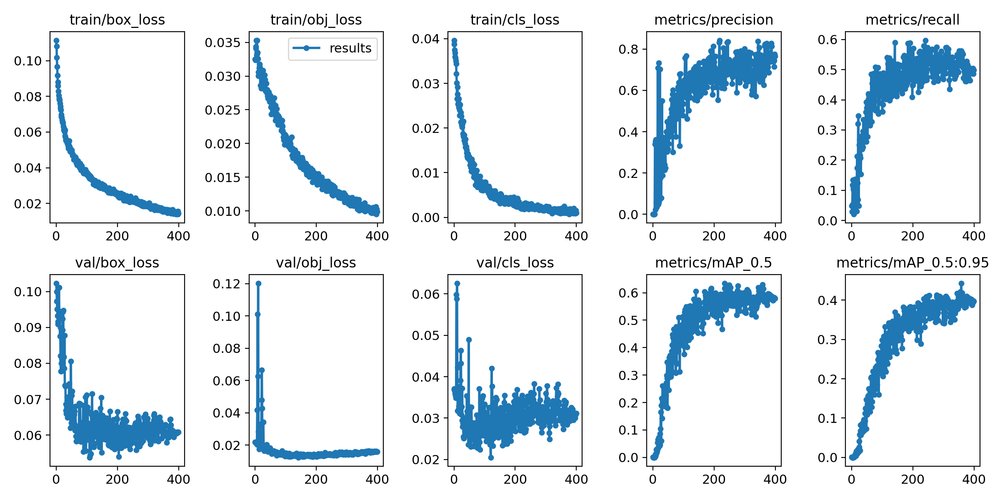

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs/train
from IPython.display import Image  # for displaying images
# first, display our ground truth data
# The ground truth [Train data] is available in jpg file at location /content/yolov5/runs/train/exp2/test_batch0_labels.jpg
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/gdrive/MyDrive/object_detection/yolov5/runs/train/exp2/results.png', width=900)

In [ ]:
!python detect.py --weights /content/gdrive/MyDrive/object_detection/yolov5/runs/train/exp2/weights/last.pt --img 640 --conf 0.25 --source /content/gdrive/MyDrive/object_detection/detection/test/ --save-conf

detect: weights=['/content/gdrive/MyDrive/object_detection/yolov5/runs/train/exp2/weights/last.pt'], source=/content/gdrive/MyDrive/object_detection/detection/test/, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-211-g32a9218 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5m summary: 212 layers, 20861016 parameters, 0 gradients, 47.9 GFLOPs
image 1/9 /content/gdrive/MyDrive/object_detection/detection/test/11Truck.jpg: 384x640 1 Truck, 22.2ms
image 2/9 /content/gdrive/MyDrive/object_detection/detection/test/12car.jpg: 480x640 3 Cars, 23.4ms
image 3/9 /content/gdrive/MyDrive/object_detection/dete

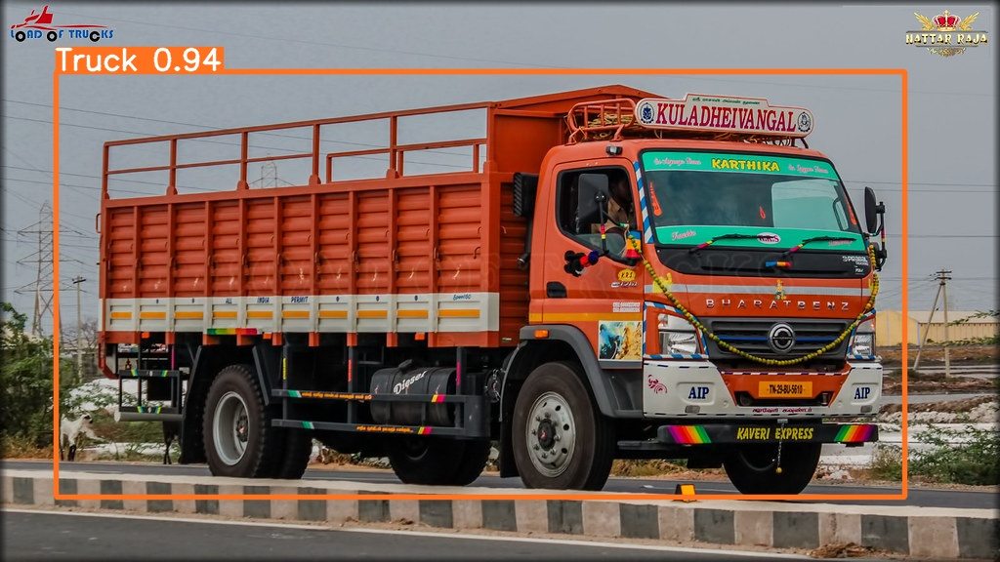

.................................................
.................................................
.................................................


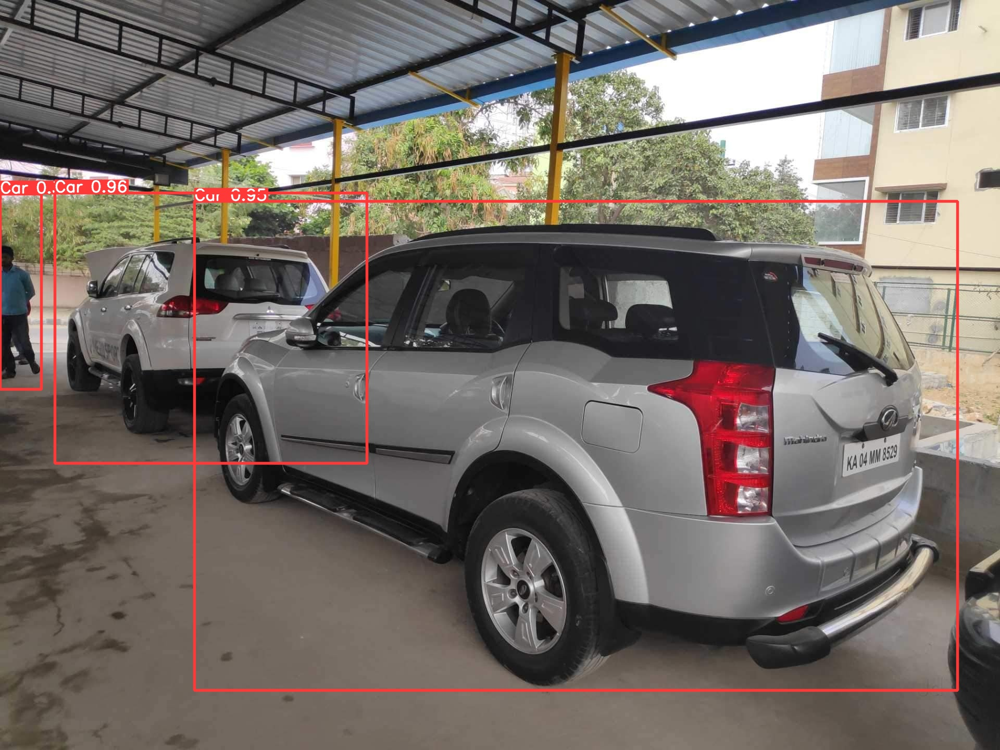

.................................................
.................................................
.................................................


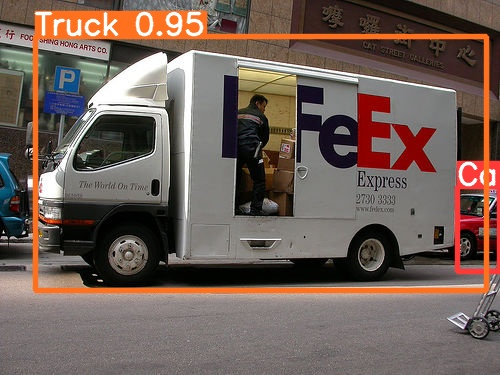

.................................................
.................................................
.................................................


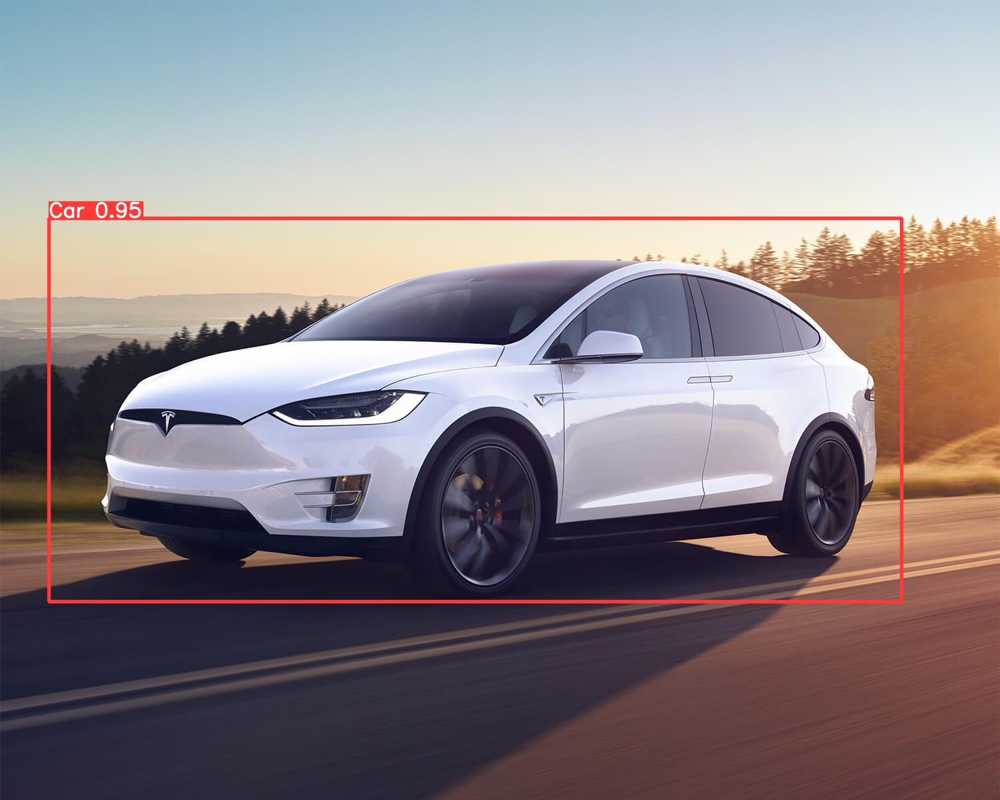

.................................................
.................................................
.................................................


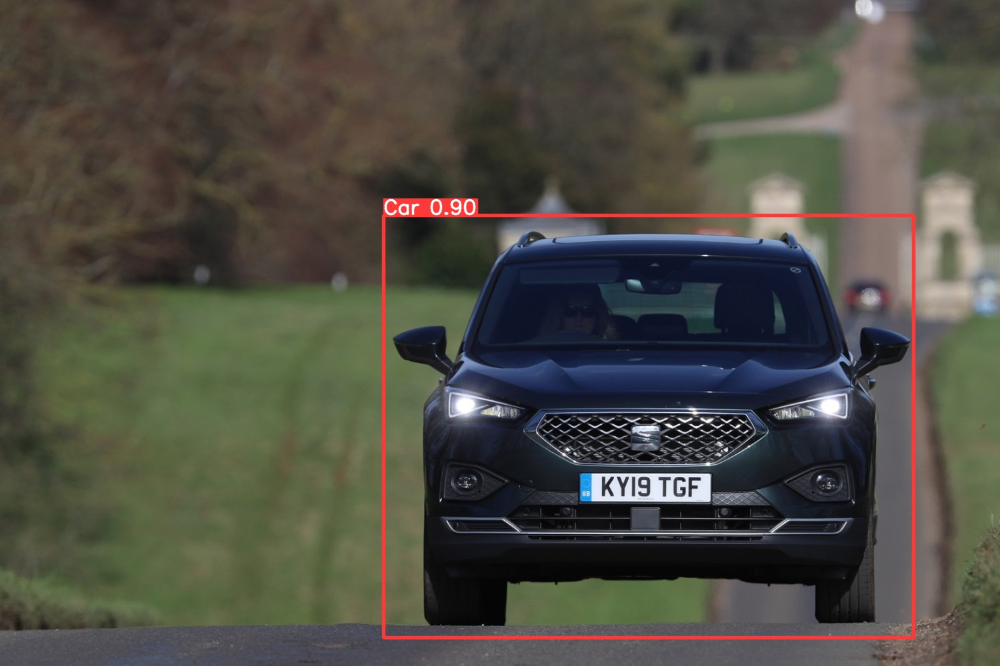

.................................................
.................................................
.................................................


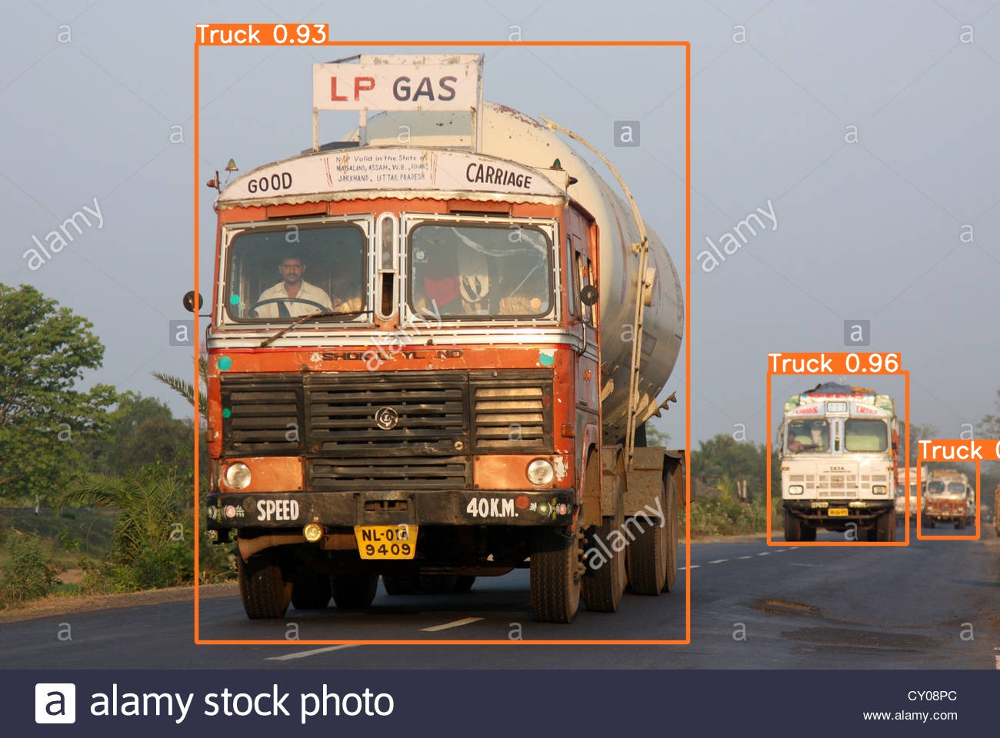

.................................................
.................................................
.................................................


In [ ]:
import glob
from IPython.display import Image ,display # for displaying images
for imagename in glob.glob('/content/gdrive/MyDrive/object_detection/yolov5/runs/detect/exp2/*.jpg'):
    display(Image(filename=imagename))
    print('.................................................')
    print('.................................................')
    print('.................................................')

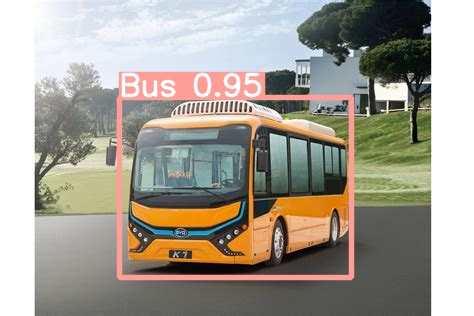

.................................................
.................................................
.................................................


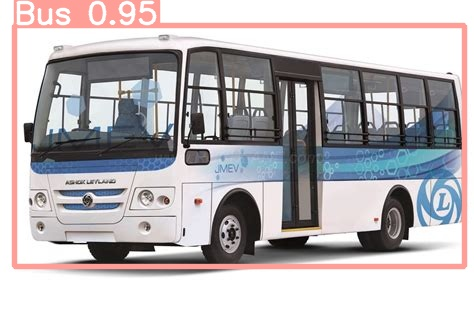

.................................................
.................................................
.................................................


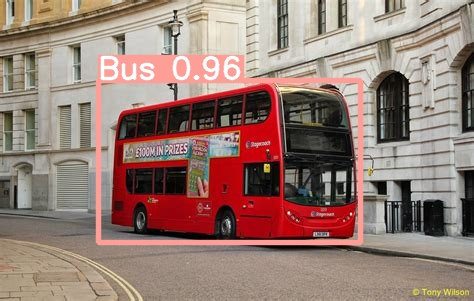

.................................................
.................................................
.................................................


In [ ]:
import glob
from IPython.display import Image ,display # for displaying images
for imagename in glob.glob('/content/gdrive/MyDrive/object_detection/yolov5/runs/detect/exp2/*.jpeg'):
    display(Image(filename=imagename))
    print('.................................................')
    print('.................................................')
    print('.................................................')

In [ ]:
!python detect.py --weights /content/gdrive/MyDrive/object_detection/yolov5/runs/train/exp2/weights/last.pt --img 640 --conf 0.25 --source /content/gdrive/MyDrive/object_detection/detection/Road_traffic.mp4 --save-conf

Streaming output truncated to the last 5000 lines.
video 1/1 (4187/9184) /content/gdrive/MyDrive/object_detection/detection/Road_traffic.mp4: 384x640 2 Cars, 15.9ms
video 1/1 (4188/9184) /content/gdrive/MyDrive/object_detection/detection/Road_traffic.mp4: 384x640 2 Cars, 16.0ms
video 1/1 (4189/9184) /content/gdrive/MyDrive/object_detection/detection/Road_traffic.mp4: 384x640 1 Car, 15.9ms
video 1/1 (4190/9184) /content/gdrive/MyDrive/object_detection/detection/Road_traffic.mp4: 384x640 1 Car, 18.5ms
video 1/1 (4191/9184) /content/gdrive/MyDrive/object_detection/detection/Road_traffic.mp4: 384x640 2 Cars, 15.9ms
video 1/1 (4192/9184) /content/gdrive/MyDrive/object_detection/detection/Road_traffic.mp4: 384x640 1 Car, 16.0ms
video 1/1 (4193/9184) /content/gdrive/MyDrive/object_detection/detection/Road_traffic.mp4: 384x640 2 Cars, 16.0ms
video 1/1 (4194/9184) /content/gdrive/MyDrive/object_detection/detection/Road_traffic.mp4: 384x640 2 Cars, 16.0ms
video 1/1 (4195/9184) /content/gdrive/My

In [ ]:
from IPython.display import Image ,Video,display
Video('/content/gdrive/MyDrive/object_detection/yolov5/runs/detect/exp3/Road_traffic.mp4')